# Lecture 02: Clustering class demo

![](../img/eva-fun-times.png)

To run the code below, you need to install pytorch and torchvision in the course conda environment. 

```conda install pytorch torchvision -c pytorch```

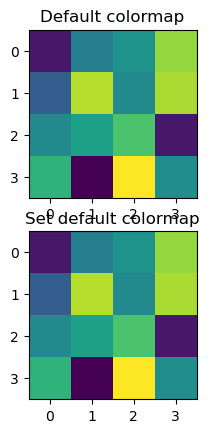

In [1]:
import numpy as np
import pandas as pd
import sys
import os
import torch, torchvision
from torchvision import datasets, models, transforms, utils
from PIL import Image
from torchvision import transforms
from torchvision.models import vgg16
import matplotlib.pyplot as plt
sys.path.append(os.path.join(os.path.abspath(".."), "code"))
from plotting_functions import *

## Hierarchical clustering on recipes dataset

Let's create a dendrogram on a more realistic dataset. 

We'll use [Kaggle's Food.com recipes corpus](https://www.kaggle.com/shuyangli94/food-com-recipes-and-user-interactions). This corpus contains 180K+ recipes and 700K+ recipe reviews. In this lab, we'll only focus on recipes and **not** on reviews. The recipes are present in `RAW_recipes.csv`. Our goal is to find categories or groupings of recipes from this corpus based on their names. 

In [2]:
orig_recipes_df = pd.read_csv("../data/RAW_recipes.csv")
orig_recipes_df.shape

(231637, 12)

In [3]:
def get_recipes_sample(orig_recipes_df, n_tags=300, min_len=5):
    orig_recipes_df = orig_recipes_df.dropna()  # Remove rows with NaNs.    
    orig_recipes_df = orig_recipes_df.drop_duplicates(
        "name"
    )  # Remove rows with duplicate names.
    orig_recipes_df = orig_recipes_df[orig_recipes_df["name"].apply(len) >= min_len] # Remove rows where recipe names are too short (< 5 characters).
    first_n = orig_recipes_df["tags"].value_counts()[0:n_tags].index.tolist() # Only consider the rows where tags are one of the most frequent n tags.
    recipes_df = orig_recipes_df[orig_recipes_df["tags"].isin(first_n)]
    return recipes_df

In [4]:
recipes_df = get_recipes_sample(orig_recipes_df)
recipes_df.shape

(9100, 12)

In [5]:
recipes_df["name"]

42            i yam what i yam  muffins
101             to your health  muffins
129       250 00 chocolate chip cookies
138                       lplermagronen
163             california roll   salad
                      ...              
231430      zucchini wheat germ cookies
231514         zucchini blueberry bread
231547           zucchini salsa burgers
231596                    zuppa toscana
231629                     zydeco salad
Name: name, Length: 9100, dtype: object

In [6]:
from sentence_transformers import SentenceTransformer
embedder = SentenceTransformer('all-MiniLM-L6-v2')

/Users/kvarada/miniconda3/envs/563/lib/python3.11/site-packages/torch/_utils.py:831: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



In [7]:
recipe_names = recipes_df["name"].tolist()
embeddings = embedder.encode(recipe_names)
recipe_names_embeddings = pd.DataFrame(
    embeddings,
    index=recipes_df.index,
)
recipe_names_embeddings

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
42,0.019592,-0.088336,0.072677,-0.034575,-0.048741,-0.049801,0.175334,-0.055191,0.020301,0.019828,...,0.063293,-0.067171,0.087499,-0.061550,0.039297,-0.050147,0.027708,0.056843,0.056151,-0.122506
101,-0.000567,-0.011825,0.073199,0.058175,0.031688,-0.015428,0.168134,0.000466,0.033078,-0.013923,...,-0.012926,-0.015949,0.031315,-0.059074,0.014143,-0.047270,0.007844,0.035501,0.076061,-0.078119
129,-0.022604,0.065034,-0.033065,0.014450,-0.105039,-0.050559,0.100076,0.022929,-0.037398,0.011857,...,0.007971,-0.019165,0.004935,0.009005,0.000919,-0.040078,0.008650,-0.075781,-0.083477,-0.123240
138,-0.066915,0.025988,-0.087689,-0.006847,-0.012861,0.049035,0.035351,0.124966,-0.011697,-0.050179,...,-0.042345,-0.005794,-0.031800,0.120664,-0.057335,-0.077068,0.001653,-0.048223,0.116455,0.021789
163,-0.007068,-0.007308,-0.026629,-0.004153,-0.052810,0.011126,0.024000,-0.036993,0.023526,-0.046870,...,-0.018432,0.051918,0.036102,-0.035312,0.005817,0.101802,-0.063171,-0.007917,0.089744,0.006997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231430,-0.036366,0.087173,-0.039641,0.002705,0.097142,-0.075385,0.068207,0.010435,-0.069214,0.010464,...,0.050988,-0.064541,0.090829,-0.004570,0.079109,0.019663,-0.058483,-0.048723,0.019152,-0.012266
231514,-0.052718,0.008980,-0.046014,0.030194,0.005201,0.009964,-0.006760,0.030238,-0.031474,0.024632,...,0.075467,0.000967,0.085033,-0.006520,0.031094,0.072901,-0.094975,-0.052466,-0.003300,-0.006991
231547,-0.080801,0.004295,-0.044325,0.038307,-0.030125,-0.063566,0.004788,0.004822,0.015525,-0.040094,...,0.066642,0.016605,0.096211,-0.023969,0.045752,0.017091,-0.062939,-0.016950,0.012060,0.039776
231596,-0.060801,0.111672,-0.108755,0.052323,-0.099851,-0.027532,0.084190,-0.004861,0.002891,0.013944,...,0.038082,-0.014214,0.048392,0.050377,0.015281,0.106766,0.032009,0.020113,0.004977,-0.005828


<br><br>

In [8]:
def plot_dendrogram(Z, labels, w=15, h=20, p=10):
    fig, ax = plt.subplots(figsize=(w, h))
    dendrogram(
        Z,
        p=p,
        truncate_mode="level",
        orientation="left",
        leaf_font_size=12,
        labels=labels,
        ax=ax,
    )
    ax = plt.gca()
    ax.set_ylabel("Cluster distances", fontsize=w)

In [9]:
from scipy.cluster.hierarchy import dendrogram, linkage

recipe_names = recipes_df["name"].tolist()
Z = linkage(embeddings, method="complete", metric="cosine")

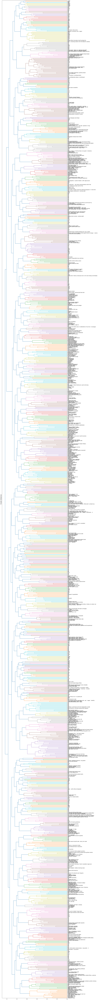

In [10]:
plot_dendrogram(Z, labels=recipe_names, w=15, h=230, p=10)

<br><br><br><br>

## Let's cluster images!!

For this demo, I'm going to use the following image dataset: 
1. A tiny subset of [Food-101](https://www.kaggle.com/datasets/kmader/food41?select=food_c101_n10099_r32x32x1.h5) from last lecture
(available [here](https://github.ubc.ca/mds-2021-22/datasets/blob/master/data/food.zip)).
2. A small subset of [Human Faces dataset](https://www.kaggle.com/datasets/ashwingupta3012/human-faces) (available [here](https://ubcca-my.sharepoint.com/:u:/g/personal/varada_kolhatkar_ubc_ca/EYDqm7QJLfdGh1A0dyqh76kB6PH9ohca-lVrJGATrEh3CQ?e=msqcPM)).

Let's start with  small subset of birds dataset. You can experiment with a bigger dataset if you like.

In [11]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [12]:
import random
def set_seed(seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

In [13]:
set_seed(seed=42)

In [14]:
import glob
IMAGE_SIZE = 224
def read_img_dataset(data_dir, BATCH_SIZE):     
    data_transforms = transforms.Compose(
        [
            transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),     
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),            
        ])
               
    image_dataset = datasets.ImageFolder(root=data_dir, transform=data_transforms)
    dataloader = torch.utils.data.DataLoader(
         image_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0
    )
    dataset_size = len(image_dataset)
    class_names = image_dataset.classes
    inputs, classes = next(iter(dataloader))
    return inputs, classes

In [15]:
def plot_sample_imgs(inputs):
    plt.figure(figsize=(10, 70)); plt.axis("off"); plt.title("Sample Training Images")
    plt.imshow(np.transpose(utils.make_grid(inputs, padding=1, normalize=True),(1, 2, 0)));

In [16]:
def get_features(model, inputs):
    """Extract output of densenet model"""
    model.eval()
    with torch.no_grad():  # turn off computational graph stuff        
        Z = model(inputs).detach().numpy()         
    return Z

In [17]:
densenet = models.densenet121(weights="DenseNet121_Weights.IMAGENET1K_V1")
densenet.classifier = torch.nn.Identity()  # remove that last "classification" layer

In [18]:
data_dir = "../data/food"
file_names = [image_file for image_file in glob.glob(data_dir + "/*/*.jpg")]
n_images = len(file_names)
BATCH_SIZE = n_images  # because our dataset is quite small
food_inputs, food_classes = read_img_dataset(data_dir, BATCH_SIZE)
n_images

350

In [19]:
X_food = food_inputs.numpy()

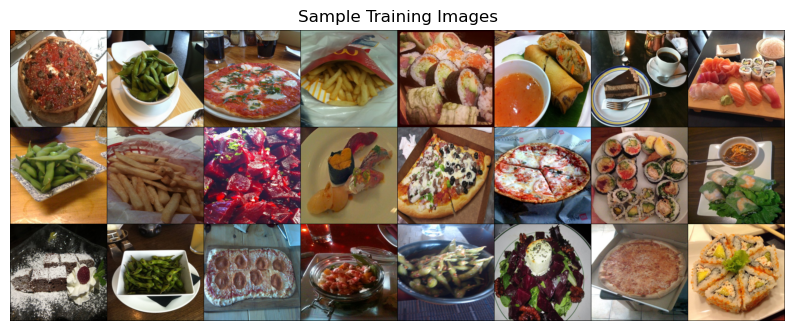

In [20]:
plot_sample_imgs(food_inputs[0:24,:,:,:])

In [21]:
Z_food = get_features(
    densenet, food_inputs, 
)

In [22]:
Z_food.shape

(350, 1024)

In [23]:
from sklearn.cluster import KMeans

k = 7
km = KMeans(n_clusters=k, n_init='auto', random_state=123)
km.fit(Z_food)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


KMeans(n_clusters=7, random_state=123)

82
Image indices:  [ 82 334 265  35 114 343]


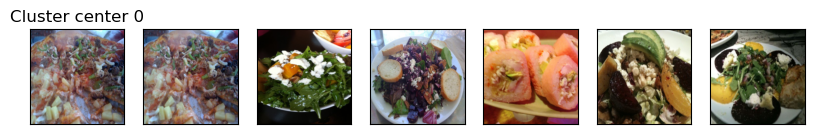

276
Image indices:  [276 191 186  29 265 343]


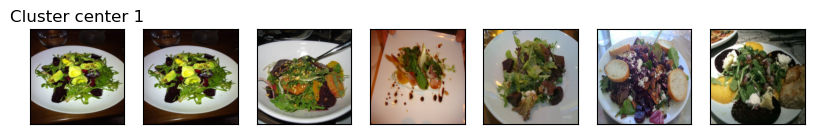

161
Image indices:  [161 102 190 241  56  76]


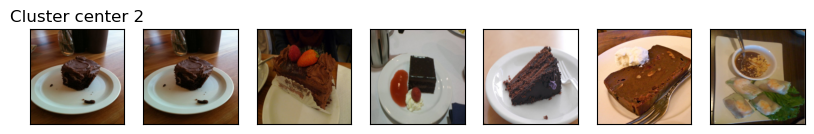

76
Image indices:  [ 76  39 259 295 313 138]


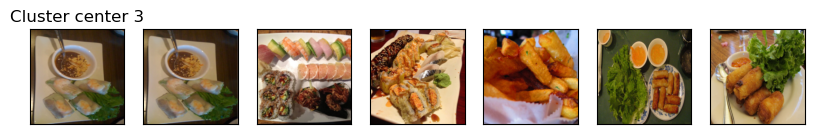

124
Image indices:  [124 253  25  27 223 280]


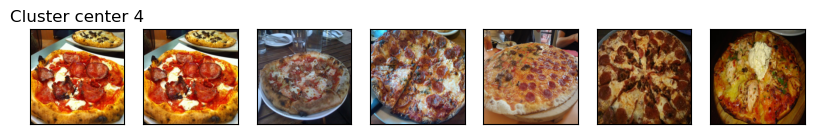

214
Image indices:  [214  20 141 249 203 274]


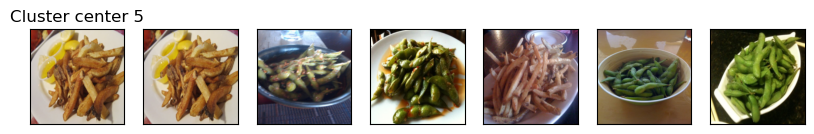

48
Image indices:  [ 48  76  61   5  89 138]


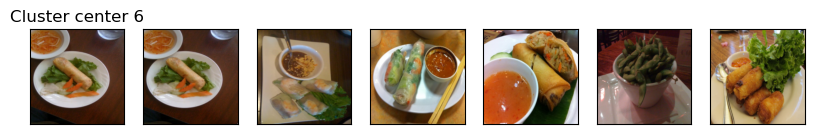

In [24]:
for cluster in range(k):
    get_cluster_images(km, Z_food, X_food, cluster, n_img=6)

Let's try DBSCAN.

In [25]:
dbscan = DBSCAN()

labels = dbscan.fit_predict(Z_food)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


It identified all points as noise points. Let's explore the distances between points. 

In [26]:
from sklearn.metrics.pairwise import euclidean_distances

dists = euclidean_distances(Z_food)
np.fill_diagonal(dists, np.inf)
dists_df = pd.DataFrame(dists)
dists_df

,0,1,2,3,4,5,6,7,8,9,...,340,341,342,343,344,345,346,347,348,349
0,inf,27.170055,23.031958,29.344772,27.464478,25.905247,28.601202,27.226376,27.482912,27.221527,...,27.895399,28.627733,28.157883,24.296227,27.864172,26.458879,28.636673,23.513233,26.565342,27.202257
1,27.170055,inf,22.623018,24.378826,25.491858,21.179714,25.291124,22.400305,17.118834,23.523634,...,22.605633,19.422020,22.297943,20.873520,24.695148,23.107439,21.258476,19.471344,20.257626,22.101439
2,23.031958,22.623018,inf,28.764128,25.544815,23.159748,26.158796,23.423162,23.352556,25.552362,...,26.763517,25.627247,27.411243,22.771503,24.695318,25.684536,26.029621,20.417007,21.786676,22.903088
3,29.344772,24.378826,28.764128,inf,28.520514,23.345848,28.131292,27.448324,24.425114,19.679522,...,22.209078,26.940432,26.980904,25.166636,27.609043,21.547798,26.480221,24.750486,25.170488,26.520864
4,27.464478,25.491858,25.544815,28.520514,inf,21.172094,26.477962,23.458080,24.881802,26.123205,...,26.482220,24.862627,26.194000,22.634821,26.464811,25.304203,25.343525,23.945744,23.584085,25.460310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,26.458879,23.107439,25.684536,21.547798,25.304203,22.533878,26.831320,24.927713,22.792896,21.153379,...,20.873121,24.183710,25.783279,23.444519,25.757414,inf,24.095846,22.627157,24.188881,24.653481
346,28.636673,21.258476,26.029621,26.480221,25.343525,21.611740,26.205790,25.979347,20.662193,23.817635,...,22.648520,21.091978,21.743126,23.498369,27.345230,24.095846,inf,22.860321,24.492981,25.513124
347,23.513233,19.471344,20.417007,24.750486,23.945744,19.392580,23.914526,22.881351,20.868404,23.173368,...,23.511854,23.249800,23.443996,17.126703,22.055307,22.627157,22.860321,inf,18.786024,18.716606
348,26.565342,20.257626,21.786676,25.170488,23.584085,19.035461,22.507235,21.890001,18.954796,24.086979,...,24.703278,22.101397,23.019146,18.728832,22.244553,24.188881,24.492981,18.786024,inf,22.293314


In [27]:
dists.min(), np.nanmax(dists[dists != np.inf]), np.mean(dists[dists != np.inf])

(10.067173, 36.652683, 24.538565)

In [28]:
for eps in range(13, 20):
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(Z_food)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=13
Number of clusters: 2
Cluster sizes: [347   3]

eps=14
Number of clusters: 5
Cluster sizes: [334   3   6   4   3]

eps=15
Number of clusters: 4
Cluster sizes: [299  26   8  17]

eps=16
Number of clusters: 4
Cluster sizes: [248  86   3  13]

eps=17
Number of clusters: 2
Cluster sizes: [205 145]

eps=18
Number of clusters: 2
Cluster sizes: [160 190]

eps=19
Number of clusters: 2
Cluster sizes: [116 234]


In [29]:
dbscan = DBSCAN(eps=14, min_samples=3)
dbscan_labels = dbscan.fit_predict(Z_food)
print("Number of clusters: {}".format(len(np.unique(dbscan_labels))))
print("Cluster sizes: {}".format(np.bincount(dbscan_labels + 1)))
print("Unique labels: {}".format(np.unique(dbscan_labels)))

Number of clusters: 5
Cluster sizes: [334   3   6   4   3]
Unique labels: [-1  0  1  2  3]


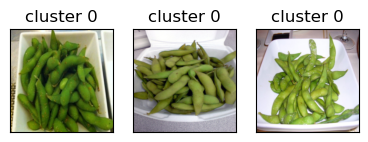

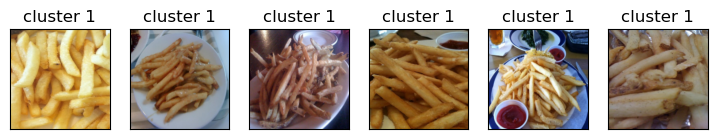

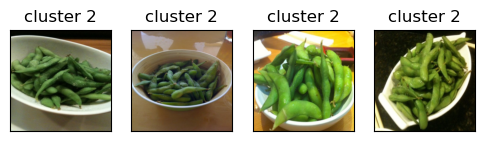

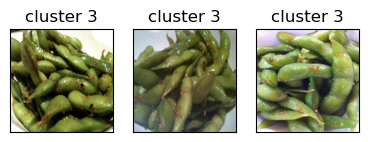

In [30]:
print_dbscan_clusters(Z_food, food_inputs, dbscan_labels)

Let's examine noise points identified by DBSCAN. 

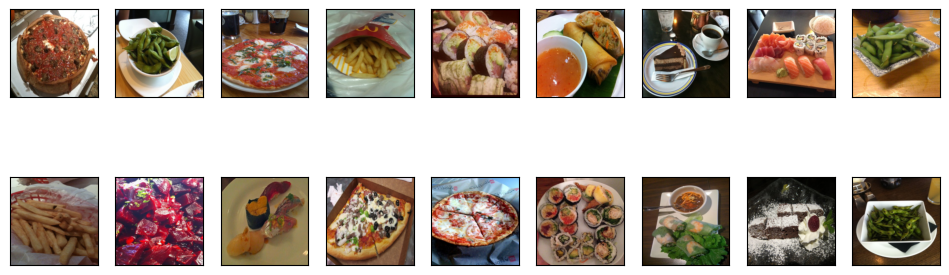

In [31]:
print_dbscan_noise_images(Z_food, food_inputs, dbscan_labels)

<br><br>

Now let's try another dataset with human faces, a small subset of [Human Faces dataset](https://www.kaggle.com/datasets/ashwingupta3012/human-faces) (available [here](https://ubcca-my.sharepoint.com/:u:/g/personal/varada_kolhatkar_ubc_ca/EYDqm7QJLfdGh1A0dyqh76kB6PH9ohca-lVrJGATrEh3CQ?e=msqcPM)).

In [32]:
data_dir = "../data/people"
file_names = [image_file for image_file in glob.glob(data_dir + "/*/*.jpg")]
n_images = len(file_names)
BATCH_SIZE = n_images  # because our dataset is quite small
faces_inputs, classes = read_img_dataset(data_dir, BATCH_SIZE)

In [33]:
n_images

367

In [34]:
X_faces = faces_inputs.numpy()
X_faces.shape

(367, 3, 224, 224)

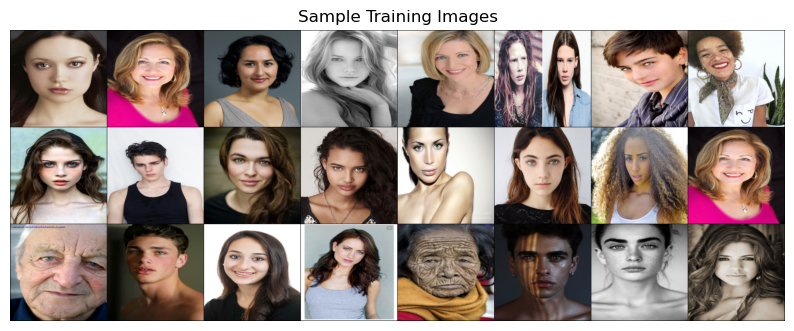

In [35]:
plot_sample_imgs(faces_inputs[0:24,:,:,:])

In [36]:
Z_faces = get_features(
    densenet, faces_inputs, 
)

In [37]:
Z_faces.shape

(367, 1024)

In [38]:
from sklearn.cluster import KMeans

k = 7
km = KMeans(n_clusters=k, n_init='auto', random_state=123)
km.fit(Z_faces)

KMeans(n_clusters=7, random_state=123)

In [39]:
km.cluster_centers_.shape

(7, 1024)

128
Image indices:  [128 146  67  10  18  56]


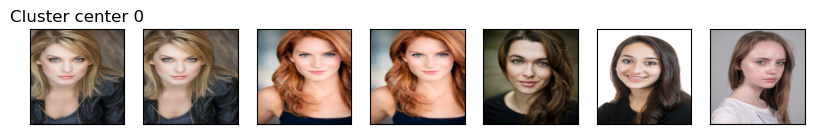

67
Image indices:  [146  67 210 241 321  24]


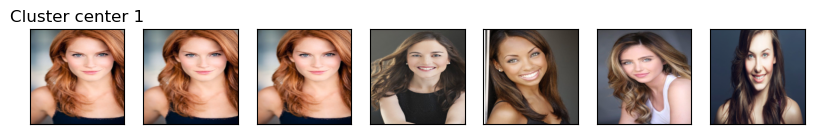

92
Image indices:  [211  92 331 170   0 274]


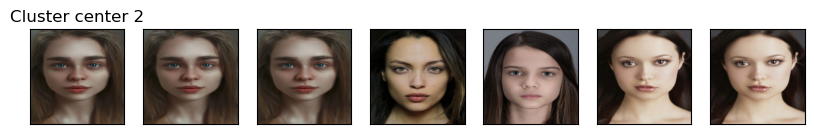

272
Image indices:  [272  28 249  38  87 243]


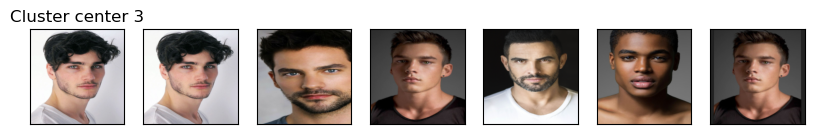

150
Image indices:  [150 193 320 308 302 105]


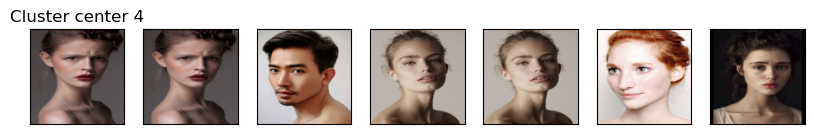

318
Image indices:  [318  83 109 366  36 272]


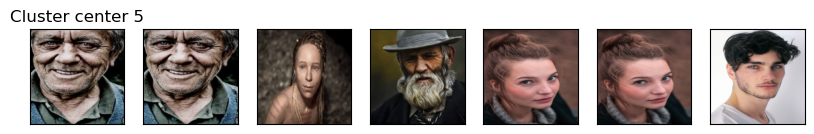

362
Image indices:  [362 164 242  42  69 186]


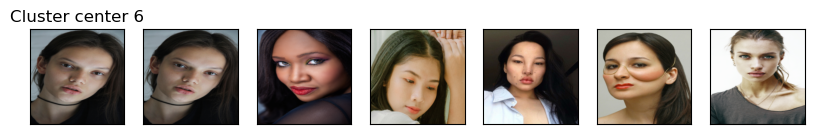

In [40]:
for cluster in range(k):
    get_cluster_images(km, Z_faces, X_faces, cluster, n_img=6)

<br><br>

### Clustering faces with DBSCAN

In [41]:
dbscan = DBSCAN()
labels = dbscan.fit_predict(Z_faces)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


In [42]:
dists = euclidean_distances(Z_faces)
np.fill_diagonal(dists, np.inf)

dist_df = pd.DataFrame(
    dists
)

dist_df.iloc[10:20, 10:20]

,10,11,12,13,14,15,16,17,18,19
10,inf,14.686935,21.547512,13.875407,18.288515,12.808964,20.555487,16.590254,9.884141,14.243562
11,14.686935,inf,20.484268,16.409140,16.682758,15.932351,21.362122,17.187832,14.117254,15.732210
12,21.547512,20.484268,inf,21.281721,21.584352,21.747551,22.890703,15.583789,20.823399,18.850285
13,13.875407,16.409140,21.281721,inf,19.584244,14.986351,24.546141,20.170977,12.813548,16.071207
14,18.288515,16.682758,21.584352,19.584244,inf,16.372135,22.501001,19.135139,18.132500,18.606798
15,12.808964,15.932351,21.747551,14.986351,16.372135,inf,22.083078,17.554756,12.090057,14.520963
16,20.555487,21.362122,22.890703,24.546141,22.501001,22.083078,inf,17.042555,21.822445,20.690748
17,16.590254,17.187832,15.583789,20.170977,19.135139,17.554756,17.042555,inf,17.113522,16.881115
18,9.884141,14.117254,20.823399,12.813548,18.132500,12.090057,21.822445,17.113522,inf,14.368977
19,14.243562,15.732210,18.850285,16.071207,18.606798,14.520963,20.690748,16.881115,14.368977,inf


In [43]:
dists.min(), np.nanmax(dists[dists != np.inf]), np.mean(dists[dists != np.inf])

(0.0, 32.12697, 18.71584)

In [44]:
for eps in [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(Z_faces)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=8
Number of clusters: 6
Cluster sizes: [352   3   3   3   3   3]

eps=9
Number of clusters: 9
Cluster sizes: [340   3   3   3   3   6   3   3   3]

eps=10
Number of clusters: 10
Cluster sizes: [299  17  15  16   3   4   3   3   3   4]

eps=11
Number of clusters: 6
Cluster sizes: [226 128   4   3   3   3]

eps=12
Number of clusters: 3
Cluster sizes: [164 200   3]

eps=13
Number of clusters: 2
Cluster sizes: [115 252]

eps=14
Number of clusters: 2
Cluster sizes: [ 87 280]

eps=15
Number of clusters: 3
Cluster sizes: [ 62 299   6]

eps=16
Number of clusters: 3
Cluster sizes: [ 37 327   3]

eps=17
Number of clusters: 2
Cluster sizes: [ 25 342]


In [45]:
dbscan = DBSCAN(eps=10, min_samples=3)
dbscan_labels = dbscan.fit_predict(Z_faces)
print("Number of clusters: {}".format(len(np.unique(dbscan_labels))))
print("Cluster sizes: {}".format(np.bincount(dbscan_labels + 1)))
print("Unique labels: {}".format(np.unique(dbscan_labels)))

Number of clusters: 10
Cluster sizes: [299  17  15  16   3   4   3   3   3   4]
Unique labels: [-1  0  1  2  3  4  5  6  7  8]


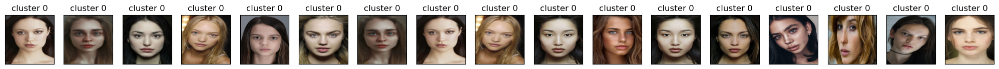

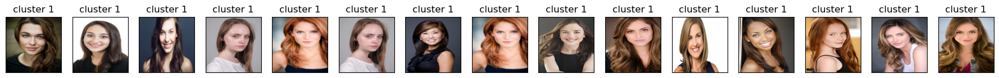

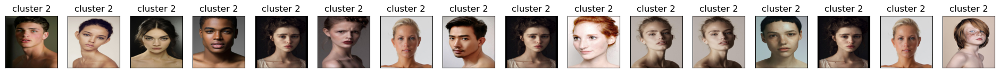

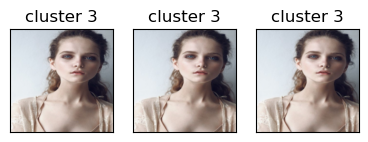

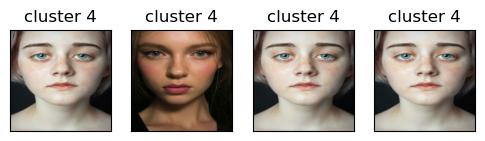

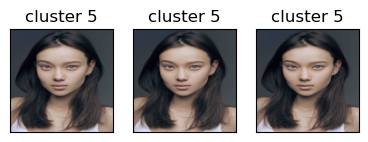

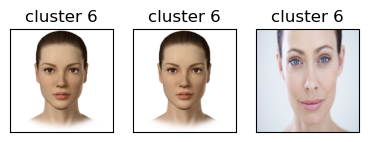

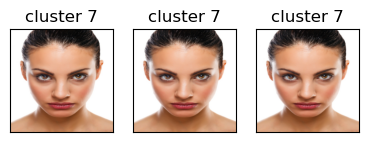

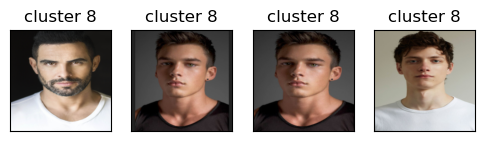

In [46]:
print_dbscan_clusters(Z_faces, faces_inputs, dbscan_labels)

Let's examine noise images identified by DBSCAN. 

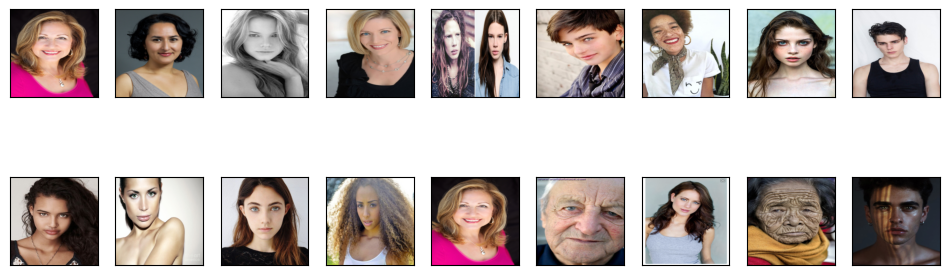

In [47]:
print_dbscan_noise_images(Z_faces, faces_inputs, dbscan_labels)

- We can guess why these images are noise images. There are odd angles, cropping, sun glasses, hands near faces etc. 

### Hierarchical clustering

In [48]:
set_seed(seed=42)

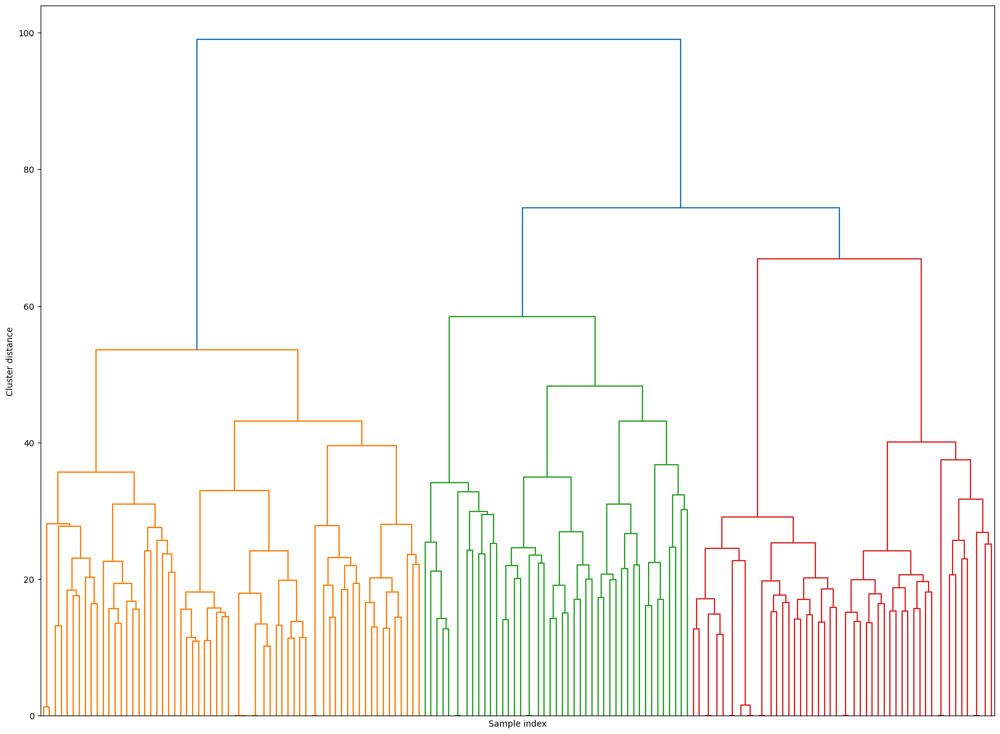

In [49]:
plt.figure(figsize=(20, 15))
Z_hrch = ward(Z_faces)
dendrogram(Z_hrch, p=7, truncate_mode="level", no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance");

In [50]:
cluster_labels = fcluster(Z_hrch, 30, criterion="maxclust")  # let's get flat clusters

In [51]:
plt.close()

/Users/kvarada/MDS/2023-24/563/DSCI_563_unsup-learn_students/lectures/code/plotting_functions.py:1480: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



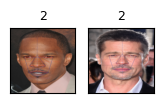

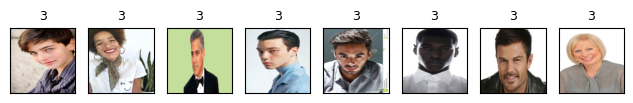

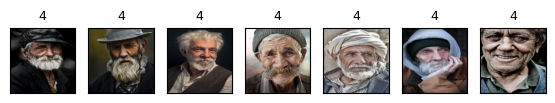

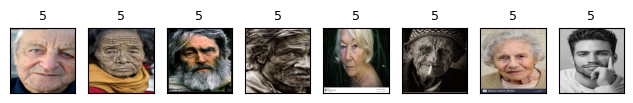

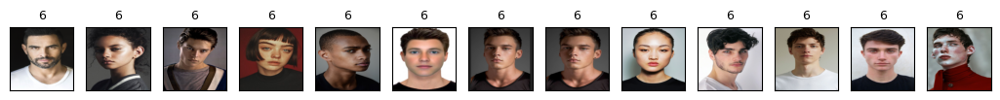

...

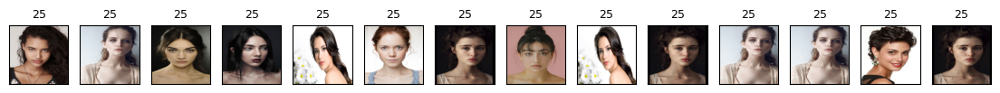

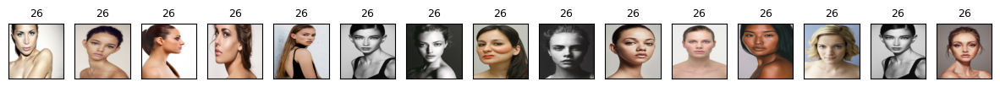

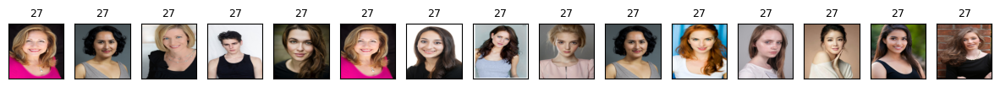

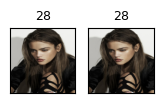

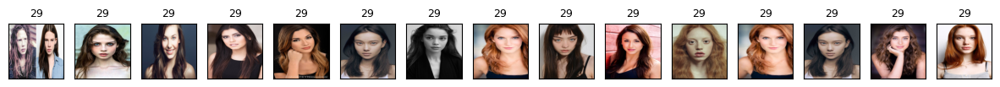

In [52]:
hand_picked_clusters = np.arange(2, 30)
#hand_picked_clusters = [2, 3, 5, 6,7, 8, 9, 10, 12, 14,15,16,17,19,20, 21,22, 24, 26, 27, 28]
print_hierarchical_clusters(
    faces_inputs, Z_faces, cluster_labels, hand_picked_clusters
)

- Some clusters correspond to people with distinct faces, age, facial expressions, hair colour and hair style, lighting and skin tone. 